<a href="https://colab.research.google.com/github/Neo-glitch/computer-vision-masterclass/blob/main/pix2pix_cGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import tensorflow.keras as keras

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

### **Load the Dataset**

In [2]:
# link to get other dataset for pix2pix cGAN work http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/
dataset_name = "facades"

_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

path_to_zip = keras.utils.get_file(
    fname = f"{dataset_name}.tar.gz",
    origin = _URL,
    extract = True
)

path_to_zip = pathlib.Path(path_to_zip)
PATH = path_to_zip.parent/dataset_name

# list paths in dir
list(PATH.parent.iterdir())

30168306/30168306 [==============================] - 17s 1us/step


[PosixPath('/root/.keras/datasets/facades'),
 PosixPath('/root/.keras/datasets/facades.tar.gz')]

image sample shape is: (256, 512, 3)



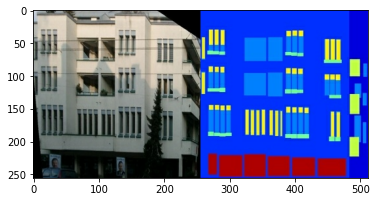

In [3]:
# read a single image where each image is 256 x 512 that's col space has two 256 images
# one for ground truth and other for achitectural blueprint like image
sample_image = tf.io.read_file(str(PATH / 'train/1.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)   # decode the jpeg image to tensor

print(f"image sample shape is: {sample_image.shape}\n")

# plt.figure(figsize = (8, 8))
plt.imshow(sample_image)

### **Data Preprocessing**

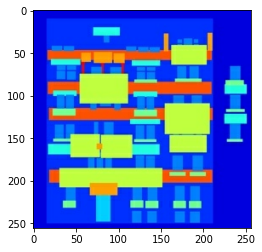

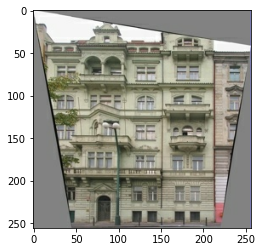

In [4]:
# helper fun to sep image into ground truth and architectural image
def load(img_file):
  image = tf.io.read_file(img_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]  # arch image(input_img to generator)
  real_image = image[:, :w, :]   # real facade image

  # convert images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image


# testing the function
inp, re = load(str(PATH / 'train/100.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

* according to pix2pix paper, we have to apply random jittering and mirroring to preprocess the training set these helper functions will help do such


In [5]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
# although depending on experiment batch size is btw range of 1 - 10 for paper
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [6]:
def resize(input_image, real_image, h, w):
  input_image  = tf.image.resize(input_image, [h, w],
                                 method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  
  real_image  = tf.image.resize(real_image, [h, w],
                                 method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  
  return input_image, real_image


def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]


# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [7]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286 x 286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # random cropping image back to 256 x 256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

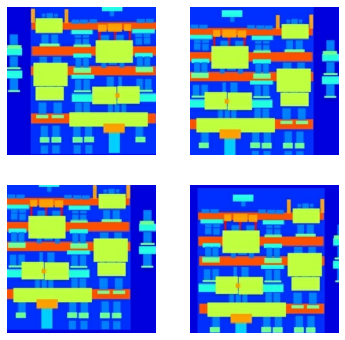

In [8]:
# test the preprocessed output
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

In [9]:
# helpers to load and preprocess train and test sets
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image


# no need for random jittering operation on test data
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

### **Build input pipeline with tf.data**

In [10]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train, 
                                  num_parallel_calls = tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [11]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

### **Build Generator**
* each block in encoder part of generator u-net arch is Conv -> Batch Norm -> Leaky ReLU
* each block in decoder part is ConvTransposed -> Batch Norm -> Dropout(applied for first 3 blocks) -> ReLU

In [12]:
OUTPUT_CHANNELS = 3

In [13]:
def downsample(filters, kernel_size, apply_batchnorm = True):
  # The encoder
  initializer = tf.random_normal_initializer(0., 0.02)
  result = keras.Sequential()
  result.add(
      keras.layers.Conv2D(filters, kernel_size, strides = 2, padding = "same",
                          kernel_initializer = initializer, use_bias = False)
  )

  if(apply_batchnorm):
    result.add(keras.layers.BatchNormalization())

  result.add(keras.layers.LeakyReLU())

  return result

In [14]:
def upsample(filters, kernel_size, apply_dropout = False):
  # decoder code
  initializer = tf.random_normal_initializer(0., 0.02)

  result = keras.Sequential()
  result.add(
      keras.layers.Conv2DTranspose(filters, kernel_size, strides = 2,
                                   padding = "same",
                                   kernel_initializer = initializer,
                                   use_bias = False)
  )
  result.add(keras.layers.BatchNormalization())

  if apply_dropout:
    result.add(keras.layers.Dropout(0.5))

  result.add(keras.layers.LeakyReLU())

  return result

In [15]:
def build_generator():
  inputs = keras.layers.Input(shape = (256, 256, 3))

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)

  # last layer to get output of gen in shape needed by discriminator
  # i.e (batch_size, 256, 256, 3)
  # tanh activation to keep image pixel in range -1 to 1
  last = keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides = 2,
                                      padding ="same",
                                      kernel_initializer = initializer,
                                      activation="tanh")
  
  x = inputs

  # downsamplinng through model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1]) # takes skip list excluding last layer and reverse list

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)


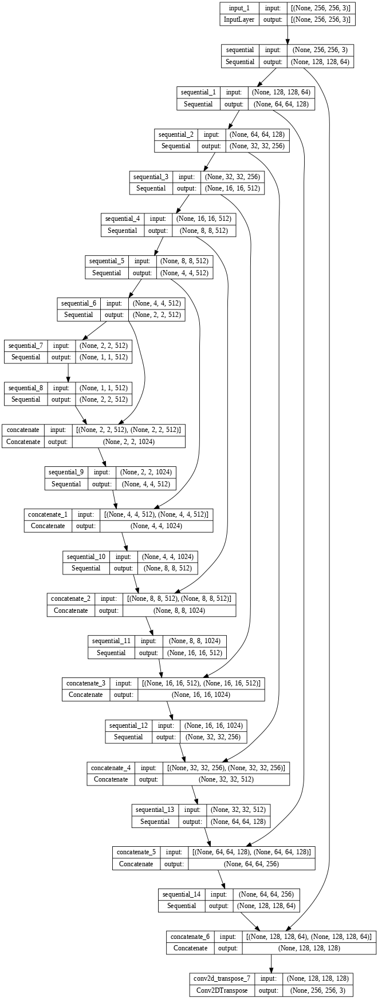

In [16]:
generator = build_generator()
keras.utils.plot_model(generator, show_shapes=True, dpi=64)

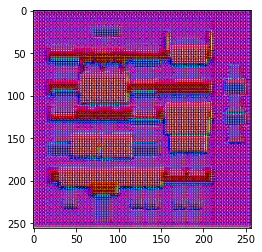

In [17]:
# test generator
gen_output = generator(inp[tf.newaxis, ...], training = False)
plt.imshow(gen_output[0, ...])

### **Build Discriminator (PatchGAN classifier)**

  * does classification on patch if real or not
  * shape of output is -> [batch_size, 30, 30, 1], where each 39 x 30 image patch of output clf a 70 x 70 portion of the input image as discussed in paper
  * it takes 2 inputs i.e input image and target image which is clf as real and also input and generated image which is clf as fake

In [18]:
def build_discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = keras.layers.Input(shape = (256, 256, 3), name = "input_image")
  tar = keras.layers.Input(shape = (256, 256, 3), name = "target_image")

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

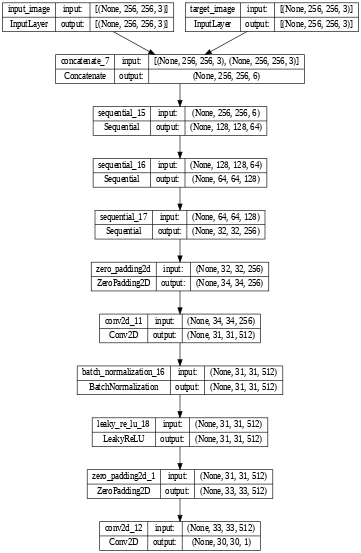

In [19]:
discriminator = build_discriminator()
keras.utils.plot_model(discriminator, show_shapes = True, dpi = 45)

### **Define Generator loss** ##
* formular for total generator loss = ```gan_loss + LAMBDA * l1_loss, where LAMBDA = 100```

In [20]:
LAMBDA = 100
loss_obj = keras.losses.BinaryCrossentropy(from_logits = True)

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_obj(tf.ones_like(disc_generated_output), disc_generated_output)

  # MAE
  l1_loss = tf.reduce_mean(tf.abs(target-gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)
  return total_gen_loss, gan_loss, l1_loss

### **Define Discriminator loss**

In [21]:
def discriminator_loss(disc_real_output, disc_generated_output):
  # the generated output is the generated image from the generator
  real_loss = loss_obj(tf.ones_like(disc_real_output), disc_real_output)
  generated_loss = loss_obj(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss
  return total_disc_loss

### **Model Training**

In [22]:
generator_optimizer = keras.optimizers.Adam(learning_rate = 2e-4)
discriminator_optimizer = keras.optimizers.Adam(learning_rate = 2e-4)

# model training checkpoint, not really needed though
checkpoint_dir = "./training_checkpoints"
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(
    # specifiy objects to track and save in checkpoints
    generator_optimizer = generator_optimizer,
    discriminator_optimizer = discriminator_optimizer,
    generator = generator,
    discriminator = discriminator
)

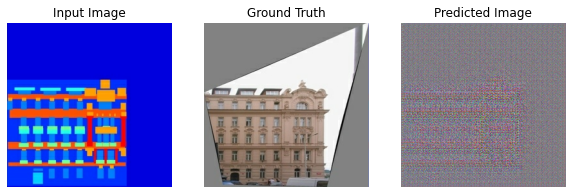

In [23]:
# helper function to generate images from generator 
def generate_images(model, test_input, tar):
  """
  model = the generator 
  test_input = the input image that acts as a condition fo the generator to know what to generate
  tar = target image or ground truth on how generator should be
  """
  # true since we want to batch stat and not accumulate stat from train set
  prediction = model(test_input, training=True) 
  plt.figure(figsize = (10, 10))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()


# test the helper function
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

In [24]:
# set up logging to TensorBoard
log_dir = "logs/"

summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
)

In [25]:
# function to handle the training each steps rather than epochs
# Since this can run of more than one dataset, and the datasets
# vary greatly in size the training loop is setup to work in steps instead of epochs.
@tf.function
def train_step(input_image, target, step):
  
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training = True)

    disc_real_output = discriminator([input_image, target], training =True)
    disc_generated_output = discriminator([input_image, gen_output], training =True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)


  generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [26]:
# function to fit the model to data
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)


In [27]:
# launch the tensorboard view to monitor training process
# while training
# n.b: do these before training

%load_ext tensorboard
%tensorboard --logdir {log_dir}

# aim is to get gan loss and disc loss to be below 0.69 for a start and then
# diff btw disc_loss and gen_gan_loss should not be too much since aim is to reduce both
# to create a better model

<IPython.core.display.Javascript object>

Time taken for 1000 steps: 94.79 sec



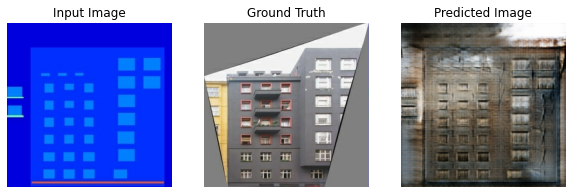

Step: 39k
....................................................................................................

In [28]:
# begin training
fit(train_dataset, test_dataset, steps = 40000)

In [30]:
# upload result of tf board to tensorboard.dev
# %tensorboard dev upload --logdir {log_dir}

### **Model Inference(generating data)**

In [31]:
%ls {checkpoint_dir}

checkpoint                  ckpt-5.data-00000-of-00001
ckpt-1.data-00000-of-00001  ckpt-5.index
ckpt-1.index                ckpt-6.data-00000-of-00001
ckpt-2.data-00000-of-00001  ckpt-6.index
ckpt-2.index                ckpt-7.data-00000-of-00001
ckpt-3.data-00000-of-00001  ckpt-7.index
ckpt-3.index                ckpt-8.data-00000-of-00001
ckpt-4.data-00000-of-00001  ckpt-8.index
ckpt-4.index


In [32]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

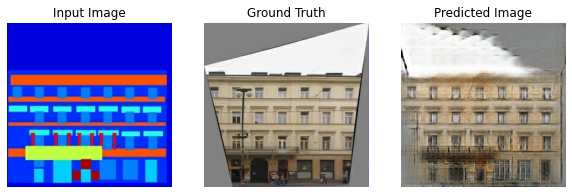

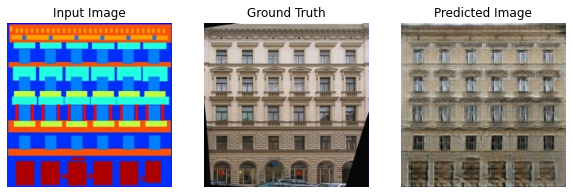

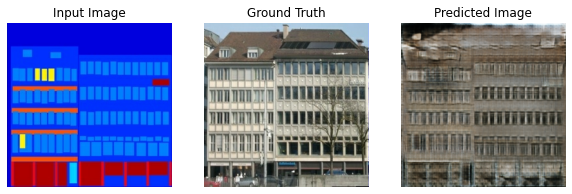

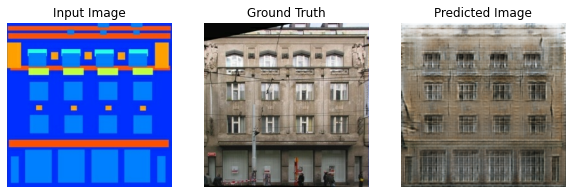

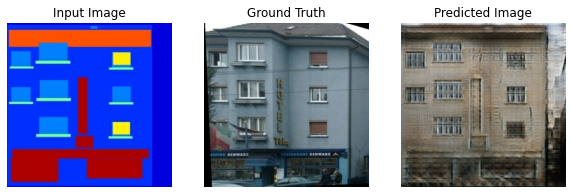

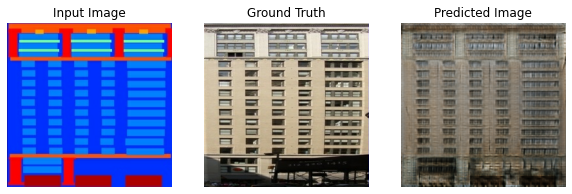

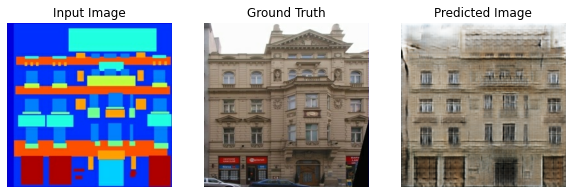

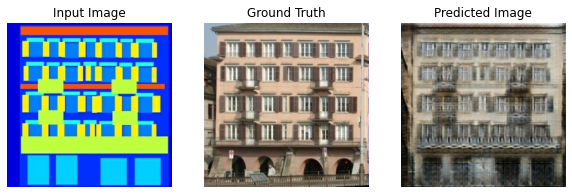

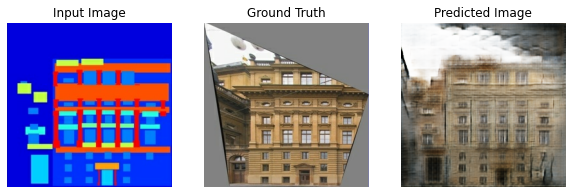

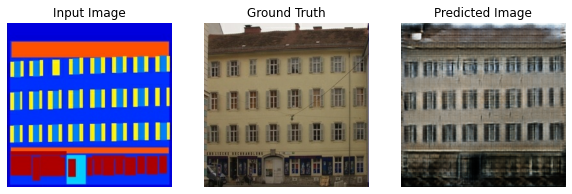

In [34]:
for inp, tar in test_dataset.take(10):
  generate_images(generator, inp, tar)

**N.b: This gan model can be further improved, I think..I will come back later to improve this**